In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import folium

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import normalize

In [2]:
data_origin = pd.read_csv('listings.csv.gz', compression='gzip')

In [3]:
data = pd.read_csv('listings.csv.gz', compression='gzip')
data

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,5570,https://www.airbnb.com/rooms/5570,20211220161302,2021-12-20,Ocean front condo on the sand,Missionbeachretreat. Great Ocean Front Condo...,While some may compare San Diego’s Mission Bea...,https://a0.muscache.com/pictures/d3342744-140a...,8435,https://www.airbnb.com/users/show/8435,...,NaN,NaN,NaN,NaN,f,3,3,0,0,NaN
1,29967,https://www.airbnb.com/rooms/29967,20211220161302,2021-12-21,"Great home, 10 min walk to Beach","This 2 bedroom, 2 full bathroom home offers al...",NaN,https://a0.muscache.com/pictures/76103867/c9b5...,129123,https://www.airbnb.com/users/show/129123,...,4.93,4.83,4.83,NaN,f,5,5,0,0,0.52
2,38245,https://www.airbnb.com/rooms/38245,20211220161302,2021-12-21,Point Loma: Den downstairs,Stay in a 1928 Spanish Style home. Den is dow...,"This neighborhood is an expensive, high-end Po...",https://a0.muscache.com/pictures/f3073822-e493...,164137,https://www.airbnb.com/users/show/164137,...,4.79,4.61,4.40,NaN,f,3,0,3,0,1.06
3,54001,https://www.airbnb.com/rooms/54001,20211220161302,2021-12-21,"La Jolla Garden Cottage: Blks to Ocn; 2Bdms, 1...","Quiet, off the beaten path, tranquility abound...","Tranquility, stately trees, meditative, zen-fu...",https://a0.muscache.com/pictures/47035b04-633c...,252692,https://www.airbnb.com/users/show/252692,...,4.97,4.97,4.88,NaN,f,2,1,1,0,2.10
4,62274,https://www.airbnb.com/rooms/62274,20211220161302,2021-12-21,"charming, colorful, close to beach","Modern, cozy, artsy, and european in a lush ga...","We are in walking distance to Starbucks, Trade...",https://a0.muscache.com/pictures/84577734/93ca...,302986,https://www.airbnb.com/users/show/302986,...,4.85,4.86,4.79,NaN,f,2,2,0,0,5.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10296,53895611,https://www.airbnb.com/rooms/53895611,20211220161302,2021-12-21,carmel valley 独栋别墅短租房带独立卫浴，每次清洁消毒,尽量女生，夫妻，家庭（需租两间）。车位很多，独栋别墅出租有两间空房，楼上楼下各一套，每间房可...,离机场25分钟，海边开车10分钟，超市5分钟，门口有公园，各大景点都在30分钟之内。,https://a0.muscache.com/pictures/miso/Hosting-...,250895609,https://www.airbnb.com/users/show/250895609,...,NaN,NaN,NaN,NaN,t,1,0,1,0,NaN
10297,53900782,https://www.airbnb.com/rooms/53900782,20211220161302,2021-12-21,Gaslamp District Comic Con 2022 Dates Availabl...,"""Comic Con 2022 Dates Avail"" The Gaslamp Plaza...","The Gaslamp Plaza Suites is a historical, Euro...",https://a0.muscache.com/pictures/miso/Hosting-...,436292000,https://www.airbnb.com/users/show/436292000,...,NaN,NaN,NaN,NaN,t,2,0,2,0,NaN
10298,53903862,https://www.airbnb.com/rooms/53903862,20211220161302,2021-12-21,Walkable PB Condo Garnet Free Parking Fast Wifi!,This 2 Bedroom Pacific Beach Condo is perfect ...,NaN,https://a0.muscache.com/pictures/d8117419-1319...,336396789,https://www.airbnb.com/users/show/336396789,...,NaN,NaN,NaN,NaN,t,9,9,0,0,NaN
10299,53908566,https://www.airbnb.com/rooms/53908566,20211220161302,2021-12-20,Water-View Home with Rooftop Deck - Private Po...,"<b>The space</b><br />Relax, rejuvenate, and r...",NaN,https://a0.muscache.com/pictures/prohost-api/H...,111814852,https://www.airbnb.com/users/show/111814852,...,NaN,NaN,NaN,NaN,t,35,35,0,0,NaN


## Data Cleaning and Preprocessing

In [4]:
df = data[['id', 'host_response_rate', 'host_is_superhost', 'latitude',
'longitude', 'room_type', 'accommodates','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 
'availability_365', 'review_scores_rating', 'review_scores_accuracy',
'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 
'review_scores_value']]
df
# Encode room type,
# Fix amendities to int
# Bathroom text
# Take mean of all review scores

,id,host_response_rate,host_is_superhost,latitude,longitude,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,price,availability_365,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,5570,100%,f,32.784810,-117.253130,Entire home/apt,6,1 bath,2.0,4.0,"[""Elevator"", ""Iron"", ""Smoke alarm"", ""Patio or ...","$2,050.00",156,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,29967,100%,f,32.807510,-117.257600,Entire home/apt,8,2 baths,2.0,3.0,"[""Carbon monoxide alarm"", ""Hangers"", ""Iron"", ""...",$234.00,246,4.85,4.85,4.70,4.95,4.93,4.83,4.83
2,38245,100%,f,32.742170,-117.219310,Private room,1,1 shared bath,1.0,1.0,"[""Carbon monoxide alarm"", ""Hangers"", ""Extra pi...",$74.00,347,4.32,4.35,4.21,4.71,4.79,4.61,4.40
3,54001,100%,t,32.813010,-117.268560,Entire home/apt,3,1 bath,2.0,3.0,"[""Carbon monoxide alarm"", ""Hangers"", ""Drying r...",$258.00,34,4.94,4.92,4.95,4.96,4.97,4.97,4.88
4,62274,100%,t,32.805830,-117.242440,Entire home/apt,2,1 bath,1.0,1.0,"[""Carbon monoxide alarm"", ""Backyard"", ""Hangers...",$80.00,322,4.77,4.87,4.86,4.93,4.85,4.86,4.79
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10296,53895611,NaN,f,32.958557,-117.207200,Private room,2,1 private bath,NaN,1.0,"[""Carbon monoxide alarm"", ""Hot water"", ""Lock o...",$53.00,356,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10297,53900782,NaN,f,32.715069,-117.159698,Private room,4,1 private bath,NaN,1.0,"[""Lock on bedroom door"", ""Kitchen"", ""Wifi"", ""A...",$260.00,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10298,53903862,100%,f,32.803373,-117.231871,Entire home/apt,8,1 bath,2.0,2.0,"[""Carbon monoxide alarm"", ""Hangers"", ""Smoke al...",$259.00,362,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10299,53908566,98%,f,32.747230,-117.189154,Entire home/apt,12,4 baths,5.0,8.0,"[""Carbon monoxide alarm"", ""Hangers"", ""Iron"", ""...","$1,090.00",364,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:

def clean(df):
    
    clean_response_rate = []
    clean_super_host = []
    clean_bathrooms = []
    clean_room = []
    clean_price = []
    clean_amentities = []
    clean_reviews = []
    room_type_vals = {'Entire home/apt' : 0, 'Private room' : 1, 'Hotel room' : 2, 'Shared room' : 3}
    for i in range(len(df["bathrooms_text"])):

        # Change response rate to decimal
        if(type(df['host_response_rate'][i]) == str):
          response_rate = float((df['host_response_rate'][i]).replace("%",""))/100
          clean_response_rate.append(response_rate)
        else:
           clean_response_rate.append(response_rate)
        # Change super host to 0 and 1
        if df['host_is_superhost'][i] =='f':
          clean_super_host.append(int(0))
        elif  df['host_is_superhost'][i] =='t':
          clean_super_host.append(int(1))
        else:
          clean_super_host.append(df['host_is_superhost'][i])

        # Change bathrooms from string "1 bathroom" -> to int "1"
        bathrooms_text = str(df["bathrooms_text"][i])
        num = 0
        for s in bathrooms_text:
            if(s.isdigit()):
                num = int(s)
        clean_bathrooms.append(num)

        # Change room type
        # 0 = 'Entire home/apt', 1 = 'Private room', 2 = 'Hotel room', 3 = 'Shared room'
        room_text = df["room_type"][i]
        clean_room.append(room_type_vals[room_text])

        # Change list of amenities to int
        clean_amentities.append(len(df["amenities"][i]))

        # Change price values - delete $, and decimal places
        new_price = df["price"][i].replace('$','')
        new_price = new_price.replace(',','')
        new_price = new_price.replace('$','')
        price_length = len(new_price)
        clean_price.append(int(new_price[:price_length-3]))

        # Change review columns, find mean and consolidate into one column
        mean = (df['review_scores_rating'][i] + df['review_scores_accuracy'][i] + df['review_scores_cleanliness'][i] + 
                df['review_scores_checkin'][i] + df['review_scores_communication'][i] + df['review_scores_location'][i] + 
                df['review_scores_value'][i])/7 
        clean_reviews.append(mean)
    df = df.rename(columns={"bathrooms_text" : "bathrooms"})
    df['host_response_rate'] = clean_response_rate
    df['host_is_superhost'] = clean_super_host
    df["bathrooms"] = clean_bathrooms
    df["room_type"] = clean_room
    df["price"] = clean_price
    df["amenities"] = clean_amentities
    df['review_avg'] = clean_reviews
    return df
clean_df = clean(df)
# df.isnull().sum(axis=0)

In [6]:
clean_df = clean_df.dropna()
clean_df

,id,host_response_rate,host_is_superhost,latitude,longitude,room_type,accommodates,bathrooms,bedrooms,beds,...,price,availability_365,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,review_avg
1,29967,1.0,0.0,32.807510,-117.257600,0,8,2,2.0,3.0,...,234,246,4.85,4.85,4.70,4.95,4.93,4.83,4.83,4.848571
2,38245,1.0,0.0,32.742170,-117.219310,1,1,1,1.0,1.0,...,74,347,4.32,4.35,4.21,4.71,4.79,4.61,4.40,4.484286
3,54001,1.0,1.0,32.813010,-117.268560,0,3,1,2.0,3.0,...,258,34,4.94,4.92,4.95,4.96,4.97,4.97,4.88,4.941429
4,62274,1.0,1.0,32.805830,-117.242440,0,2,1,1.0,1.0,...,80,322,4.77,4.87,4.86,4.93,4.85,4.86,4.79,4.847143
6,67441,1.0,1.0,32.763470,-117.077530,0,2,1,1.0,1.0,...,70,287,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10176,53707467,1.0,1.0,32.794685,-117.121896,0,10,2,3.0,6.0,...,291,155,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.000000
10185,53720922,1.0,0.0,32.800634,-117.253124,1,2,1,1.0,1.0,...,48,46,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.000000
10200,53739940,1.0,0.0,32.694786,-117.082324,1,4,1,1.0,1.0,...,45,329,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.000000
10202,53741856,1.0,1.0,32.765250,-117.084890,1,2,1,1.0,1.0,...,75,249,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.000000


In [7]:
# df.loc[:,'price'] = df['price'].replace('[\$,]', '', regex=True).astype(float)

## Data Exploration and Analysis

In [8]:
sns.set_theme()

<AxesSubplot:>

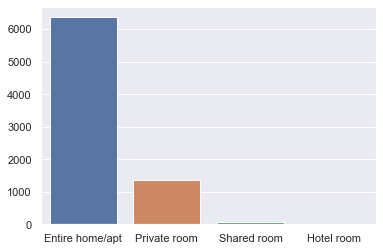

In [9]:
# Types of room
room = clean_df['room_type'].value_counts()
sns.barplot(x=df['room_type'].value_counts().index, y=room.values)

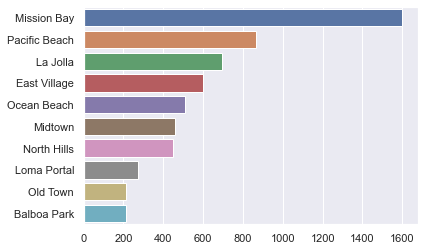

In [10]:
# Number of listings per a location
df_with_neighbor = data[['id', 'host_response_rate', 'host_is_superhost', 'neighbourhood_cleansed', 'latitude',
'longitude', 'room_type', 'accommodates','bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price', 
'availability_365', 'review_scores_rating', 'review_scores_accuracy',
'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication', 'review_scores_location', 
'review_scores_value']]
clean_df_neighbor = clean(df_with_neighbor)
location = clean_df_neighbor['neighbourhood_cleansed'].value_counts()
location_plot = location[:10]
sns.barplot(x=location_plot.values, y=location_plot.index)
# location[:10].plot.bar()
plt.show()

<AxesSubplot:>

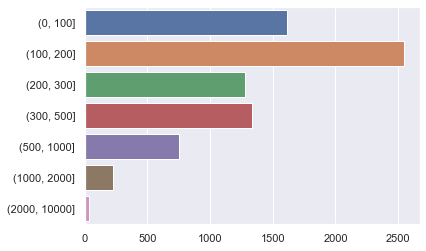

In [11]:
# Price range
price = pd.cut(clean_df['price'],[0, 100, 200, 300, 500, 1000, 2000, 10000]).value_counts().sort_index()
sns.barplot(x=price.values, y=price.index)

<AxesSubplot:>

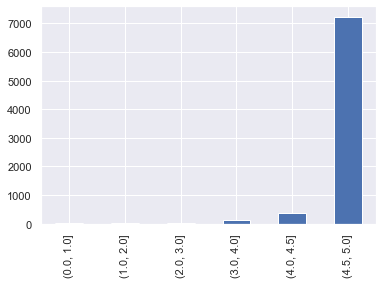

In [12]:
# Review score
price = pd.cut(clean_df['review_avg'],[0, 1.0, 2.0, 3.0, 4.0, 4.5, 5.0]).value_counts().sort_index()
price.plot.bar()

## Dimension Reduction (PCA)

In [13]:
def eigsort(V, eigvals):
    
    # Sort the eigenvalues from largest to smallest. Store the sorted
    # eigenvalues in the column vector lambd.
    lohival = np.sort(eigvals)
    lohiindex = np.argsort(eigvals)
    lambd = np.flip(lohival)
    index = np.flip(lohiindex)
    Dsort = np.diag(lambd)
    
    # Sort eigenvectors to correspond to the ordered eigenvalues. Store sorted
    # eigenvectors as columns of the matrix vsort.
    M = np.size(lambd)
    Vsort = np.zeros((M, M))
    for i in range(M):
        Vsort[:,i] = V[:,index[i]]
    return Vsort, Dsort

In [14]:
def normc(Mat):
    return normalize(Mat, norm='l2', axis=0)

### Dataframe With every column( except for id )

In [15]:
#exclude id column
pca_df_1 = clean_df.iloc[:,1:]
pca_df_1.shape

(7783, 20)

In [16]:
#Because some values are way greater than the other, rescale clean_df( normalize the dataframe)
#otherwise, scree plot looks really weird 
A_1 = StandardScaler().fit_transform(pca_df_1)

In [17]:
#maybe unnecessary step but just to be consistent with the face vectors where each column represents a face
A_1 = A_1.T
A_1.shape

(20, 7783)

In [18]:
cov_1 = A_1@A_1.T
eigvals, V_old = np.linalg.eig(cov_1)

In [19]:
V_1, D_new_1 = eigsort(V_old,eigvals)

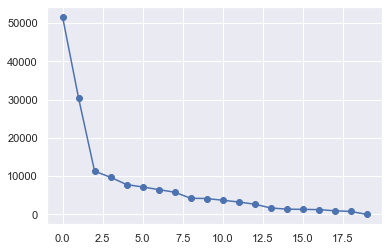

In [20]:
plt.plot(range(20), D_new_1.diagonal(), 'o-')

In [21]:
(D_new_1[0][0]+ D_new_1[1][1] + D_new_1[2][2])/sum(D_new_1.diagonal())

0.5998010593840891

3 principle components show 59% information of the cleaned dataframe

In [22]:
projected_X_1 = A_1.T @ V_1.T[0]
projected_Y_1 = A_1.T @ V_1.T[1]
projected_Z_1 = A_1.T @ V_1.T[2]

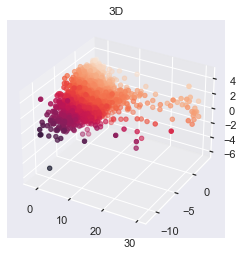

In [23]:
fig = plt.figure()

# syntax for 3-D projection
ax = plt.axes(projection ='3d')

# plotting
c = projected_Y_1+projected_Z_1
ax.scatter(projected_X_1, projected_Y_1, projected_Z_1, c= c)
ax.set_title('3D')
plt.show()

### Dataframe that only keeps review_average for review (dropped other review columns)


In [24]:
pca_df_2 = clean_df[['host_response_rate', 'host_is_superhost', 'latitude',
       'longitude', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'amenities', 'price', 'availability_365', 'review_avg']]

pca_df_2.shape

(7783, 13)

In [25]:
#Because some values are way greater than the other, rescale clean_df( normalize the dataframe)
#otherwise, scree plot looks really weird 
A_2 = StandardScaler().fit_transform(pca_df_2)

In [26]:
#maybe unnecessary step but just to be consistent with the face vectors where each column represents a face
A_2 = A_2.T
A_2.shape

(13, 7783)

In [27]:
cov_2 = A_2@A_2.T
eigvals, V_old = np.linalg.eig(cov_2)

In [28]:
V_2, D_new_2 = eigsort(V_old,eigvals)

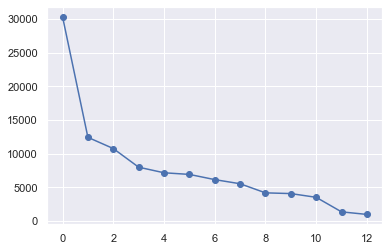

In [29]:
plt.plot(range(13), D_new_2.diagonal(), 'o-')

In [30]:
(D_new_2[0][0]+ D_new_2[1][1] + D_new_2[2][2])/sum(D_new_2.diagonal())

0.52858840211082

3 principle components show 52% information of the cleaned dataframe

In [31]:
projected_X_2 = A_2.T @ V_2.T[0]
projected_Y_2 = A_2.T @ V_2.T[1]
projected_Z_2 = A_2.T @ V_2.T[2]

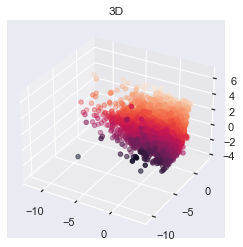

In [32]:
fig = plt.figure()

# syntax for 3-D projection
ax = plt.axes(projection ='3d')

# plotting
c = projected_Y_2+ projected_Z_2
ax.scatter(projected_X_2, projected_Y_2, projected_Z_2, c= c)
ax.set_title('3D')
plt.show()

### Dataframe that does not reveal any review info

In [33]:
pca_df_3 = clean_df[['host_response_rate', 'host_is_superhost', 'latitude',
       'longitude', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'amenities', 'price', 'availability_365']]

pca_df_3.shape

(7783, 12)

In [34]:
#Because some values are way greater than the other, rescale clean_df( normalize the dataframe)
#otherwise, scree plot looks really weird 
A_3 = StandardScaler().fit_transform(pca_df_3)

In [35]:
#maybe unnecessary step but just to be consistent with the face vectors where each column represents a face
A_3 = A_3.T
A_3.shape

(12, 7783)

In [36]:
cov_3 = A_3@A_3.T
eigvals, V_old = np.linalg.eig(cov_3)

In [37]:
V_3, D_new_3 = eigsort(V_old,eigvals)

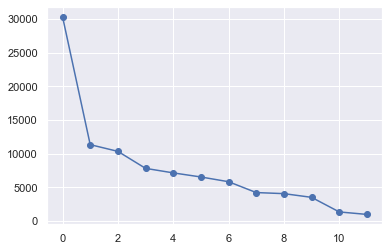

In [38]:
plt.plot(range(12), D_new_3.diagonal(), 'o-')

In [39]:
(D_new_3[0][0]+ D_new_3[1][1] + D_new_3[2][2])/sum(D_new_3.diagonal())

0.5566717400368318

3 principle components show 55% information of the cleaned dataframe

In [40]:
projected_X_3 = A_3.T @ V_3.T[0]
projected_Y_3 = A_3.T @ V_3.T[1]
projected_Z_3 = A_3.T @ V_3.T[2]

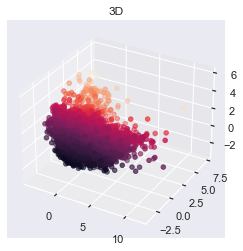

In [41]:
fig = plt.figure()

# syntax for 3-D projection
ax = plt.axes(projection ='3d')

# plotting
c = projected_Y_3+projected_Z_3
ax.scatter(projected_X_3, projected_Y_3, projected_Z_3, c= c)
ax.set_title('3D')
plt.show()

## Dataframe that does not reveal any price info.

In [42]:
pca_df_4 = clean_df[['host_response_rate', 'host_is_superhost', 'latitude',
       'longitude', 'room_type', 'accommodates', 'bathrooms', 'bedrooms',
       'beds', 'amenities', 'availability_365', 'review_avg']]

pca_df_4.shape

(7783, 12)

In [43]:
#Because some values are way greater than the other, rescale clean_df( normalize the dataframe)
#otherwise, scree plot looks really weird 
A_4 = StandardScaler().fit_transform(pca_df_4)

In [44]:
#maybe unnecessary step but just to be consistent with the face vectors where each column represents a face
A_4 = A_4.T
A_4.shape

(12, 7783)

In [45]:
cov_4 = A_4@A_4.T
eigvals, V_old = np.linalg.eig(cov_4)

Here, we can have a clear idea of which principle components are the most important below.

In [46]:
eigvals_labels = dict(zip(pca_df_4, eigvals))
{k: v for k, v in sorted(eigvals_labels.items(), key=lambda item: -item[1])}

{'host_response_rate': 26259.10615881455,
 'host_is_superhost': 12387.675220902158,
 'latitude': 10713.365805656113,
 'accommodates': 7953.9666857271,
 'bedrooms': 7138.511859550672,
 'bathrooms': 6889.93937887329,
 'beds': 6110.777193140979,
 'amenities': 5471.69435676887,
 'review_avg': 4138.684344826072,
 'availability_365': 4001.9963153239855,
 'room_type': 1369.5920085908474,
 'longitude': 960.6906718254488}

In [47]:
V_4, D_new_4 = eigsort(V_old,eigvals)

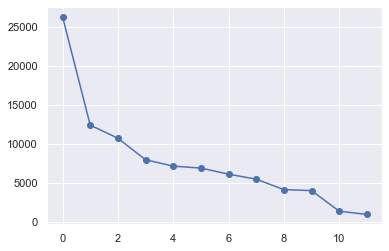

In [48]:
plt.plot(range(12), D_new_4.diagonal(), 'o-')

In [49]:
# When running 
(D_new_4[0][0]+ D_new_4[1][1] + D_new_4[2][2])/sum(D_new_4.diagonal())

0.5285038672466998

In [50]:
# Using the first 3 PCs
projected_X_4 = A_4.T @ V_4.T[0]
projected_Y_4 = A_4.T @ V_4.T[1]
projected_Z_4 = A_4.T @ V_4.T[2]

# C_noPrice3PC will be used for cluster visualization later
# C contains the data without prices
C_noPrice3PC = V_4[:,:3].T@A_4
C_noPrice3PC = C_noPrice3PC.T

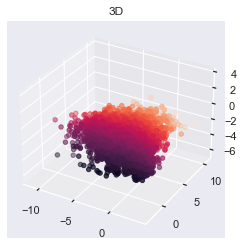

In [51]:
fig = plt.figure()

# syntax for 3-D projection
ax = plt.axes(projection ='3d')

# plotting
c = projected_Y_4+projected_Z_4
ax.scatter(projected_X_4, projected_Y_4, projected_Z_4, c= c)
ax.set_title('3D')
plt.show()

Now, we will try to use the first 6 principal components which will retain about 76% of the data variance.

In [52]:
# Using the first 6 PCs
(D_new_4[0][0]+ D_new_4[1][1] + D_new_4[2][2] + D_new_4[3][3] + D_new_4[4][4] + D_new_4[5][5])/sum(D_new_4.diagonal())

0.763871740861748

In [53]:
# NOTE: we will not be able to visualize the data here
C_noPrice6PC = V_4[:,:6].T@A_4
C_noPrice6PC = C_noPrice6PC.T

## KMeans algorithm

In [54]:
def calcSqDistances(X, Kmus):
    dist = np.zeros((len(X), len(Kmus)), dtype='float')    # Initializing with N rows (for N points) and 
                                                           # each row has K columns (for K clusters)
                                                           # [n][k] is the sq. distance betw. point x_n and cluster k 

    dist = (np.linalg.norm((X - Kmus[:,None]), axis=-1, ord=2)**2).T

    return dist

In [55]:
def determineRnk(sqDmat):
    N, K = sqDmat.shape
    Rnk = np.zeros((N, K), dtype='uint8')                  # Initializing with N rows (for N points) and each
                                                           # row has K columns (for K clusters)
                                                           # [n][k] is 1 if point x_n is closest to cluster k
    indexes = np.argmin(sqDmat, axis=-1)                   # indexes will give us an array of indexes that contain minimum sqDistance
    for n in range(N): # col
        Rnk[n][indexes[n]] = 1

    return Rnk

In [56]:
def recalcMus(X, Rnk):
    N, K = Rnk.shape                               # K of Rnk will be the # of clusters
    row, col = X.shape                             # col of X will be the dimension of a point x_n
    Mus = np.zeros((K, col))                       # Mus contains K rows (for K clusters) and 
                                                   # each row is the mean point (with dimension col) of cluster k
    for k in range(len(Rnk.T)):
        Muk = Rnk.T[k].dot(X) / Rnk.T[k].sum()     # Rnk.T[k] is a cluster k which has 1 row and n columns, 
                                                   # doing sum() will sum along the column which shows
                                                   # how many points this cluster k has
        Mus[k] = Muk
    return Mus

In [57]:
def plotCurrent(X, Rnk, Kmus):
    N, D = X.shape
    K = Kmus.shape[0]

    InitColorMat = np.array([[1, 0, 0],
                             [0, 1, 0],
                             [0, 0, 1],
                             [0, 0, 0],
                             [1, 1, 0],
                             [1, 0, 1],
                             [0, 1, 1]])

    KColorMat = InitColorMat[0:K,:]

    colorVec = np.dot(Rnk, KColorMat)
    muColorVec = np.dot(np.eye(K), KColorMat)
    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.scatter(X[:,0], X[:,1], X[:,2], alpha=0.1, c=colorVec)
#     plt.scatter(X[:,0], X[:,1], c=colorVec)

    ax.scatter(Kmus[:,0], Kmus[:,1], s=200, c=muColorVec, marker='d')
#     plt.scatter(Kmus[:,0], Kmus[:,1], s=200, c=muColorVec, marker='d')
#     plt.axis('equal')
#     plt.show()

In [58]:
def runKMeans(data, K, inertia):
    #load data file specified by fileString from Bishop book
    X = data

    #determine and store data set information
    N, D = X.shape

    #allocate space for the K mu vectors
    Kmus = np.zeros((K, D))

    #initialize cluster centers by randomly picking points from the data
    rand_inds = np.random.permutation(N)
    Kmus = X[rand_inds[0:K],:]

    #specify the maximum number of iterations to allow
    maxiters = 1000

    for iter in range(maxiters):
        #assign each data vector to closest mu vector as per Bishop (9.2)
        #do this by first calculating a squared distance matrix where the n,k entry
        #contains the squared distance from the nth data vector to the kth mu vector

        #sqDmat will be an N-by-K matrix with the n,k entry as specfied above
        sqDmat = calcSqDistances(X, Kmus)

        #given the matrix of squared distances, determine the closest cluster
        #center for each data vector

        #R is the "responsibility" matrix
        #R will be an N-by-K matrix of binary values whose n,k entry is set as
        #per Bishop (9.2)
        #Specifically, the n,k entry is 1 if point n is closest to cluster k,
        #and is 0 otherwise
        Rnk = determineRnk(sqDmat)

        KmusOld = Kmus
        # plotCurrent(X, Rnk, Kmus)
        # time.sleep(1)

        #recalculate mu values based on cluster assignments as per Bishop (9.4)
        Kmus = recalcMus(X, Rnk)





        #check to see if the cluster centers have converged.  If so, break.
        if np.sum(np.abs(KmusOld.reshape((-1, 1)) - Kmus.reshape((-1, 1)))) < 1e-6:
            # print(iter)
            sqDmat = calcSqDistances(X, Kmus)
            Rnk = determineRnk(sqDmat)
            
            # Calculate the matrix of distances of points only within their center
            # This is element-wise multiplcation
            #      If Rnk[i][j] == 1, then we record that distance
            #      If Rnk[i][j] == 0, then we don't (the multiplication will be 0)
            distWithinCenter = sqDmat*Rnk  

            # Average sum of distance between each point from its cluster center
            avgDist = np.sum(np.sum(distWithinCenter, axis=0, keepdims=True), axis=1)/K    
            # print(avgDist)
            inertia.append(avgDist[0])
                                      
            break

    # plotCurrent(X, Rnk, Kmus)
    return X, Rnk, Kmus

### Performing KMeans with both avg_reviews and price data

In [59]:
# Calculate inertia to determine how many clusters to do
inertia = []

res = []

# C contains the data without prices
C = V_2[:,:3].T@A_2
C = C.T
for k in range(1,8):
    [X, Rnk, Kmus] = runKMeans(C, k, inertia)
    res.append([X, Rnk, Kmus])

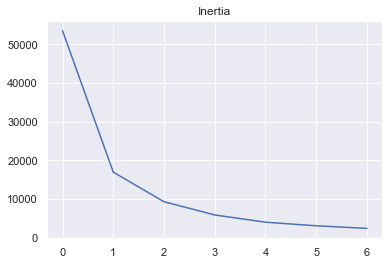

In [60]:
plt.title('Inertia')
plt.plot(range(len(inertia)), inertia)

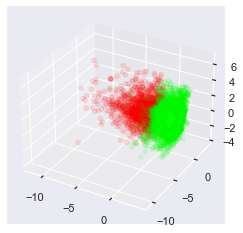

In [61]:
# Res[1] will correspond to the result of K=2 which we stored earlier
# cluster = 1 corresponds to K=2 and so on
cluster = 1
plotCurrent(res[cluster][0], res[cluster][1], res[cluster][2])

### Performing KMeans with the no avg_reviews data

In [62]:
# Calculate inertia to determine how many clusters to do
inertia_noAvgReviews = []

res_noAvgReviews = []

# C contains the data without prices
C_noAvgReviews = V_3[:,:3].T@A_3
C_noAvgReviews = C_noAvgReviews.T
for k in range(1,8):
    [X, Rnk, Kmus] = runKMeans(C_noAvgReviews, k, inertia_noAvgReviews)
    res_noAvgReviews.append([X, Rnk, Kmus])

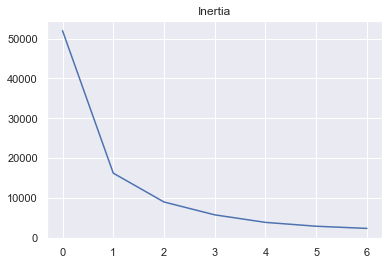

In [63]:
plt.title('Inertia')
plt.plot(range(len(inertia_noAvgReviews)), inertia_noAvgReviews)

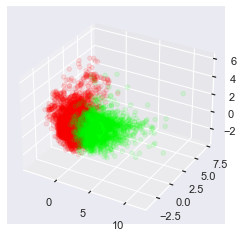

In [64]:
# Res[1] will correspond to the result of K=2 which we stored earlier
# cluster = 1 corresponds to K=2 and so on
cluster = 1
plotCurrent(res_noAvgReviews[cluster][0], res_noAvgReviews[cluster][1], res_noAvgReviews[cluster][2])

### Performing KMeans with the no prices data

Here, we're visualizing using the first 3 principal components.

In [65]:
# Calculate inertia to determine how many clusters to do
inertia_noPrice3PC = []

res_noPrice3PC = []

for k in range(1,8):
    [X, Rnk, Kmus] = runKMeans(C_noPrice3PC, k, inertia_noPrice3PC)
    res_noPrice3PC.append([X, Rnk, Kmus])

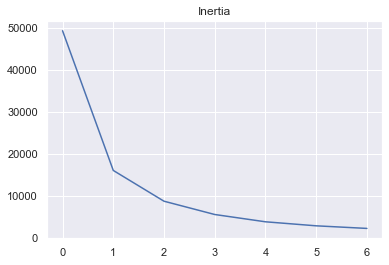

In [66]:
plt.title('Inertia')
plt.plot(range(len(inertia_noPrice3PC)), inertia_noPrice3PC)

In [67]:
C_noPrice3PC.shape

(7783, 3)

Based on the above plot, we will choose to cluster the data into 2 groups (K=2).

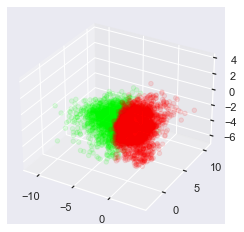

In [68]:
# Res[1] will correspond to the result of K=2 which we stored earlier
# cluster = 1 corresponds to K=2 and so on
cluster = 1
plotCurrent(res_noPrice3PC[cluster][0], res_noPrice3PC[cluster][1], res_noPrice3PC[cluster][2])

Now, we will move on to running K-Means for the transformed data using the first 6 principal component.

In [69]:
# Calculate inertia to determine how many clusters to do
inertia_noPrice6PC = []

res_noPrice6PC = []

for k in range(1,8):
    [X, Rnk, Kmus] = runKMeans(C_noPrice6PC, k, inertia_noPrice6PC)
    res_noPrice6PC.append([X, Rnk, Kmus])

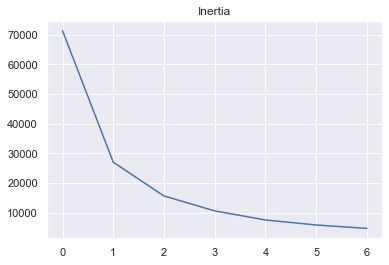

In [70]:
plt.title('Inertia')
plt.plot(range(len(inertia_noPrice6PC)), inertia_noPrice6PC)

Based on the plot above, we will also choose K=2 for the dataset with the first 6 principal components

## Visualizing data points using geo. info.

### Visualizing the 3PC data clusters on actual map

NOTE: the coloring of the geospatial maps could be swapped during runtime, but the interpretation is still the same (the ones near the beach seem to be more expensive)

In [71]:
def plotMap(data):
    # Here, we're using the data with prices dropped
    location_map = folium.Map()

    # K=2
    cluster_num = 1
    coords = clean_df[['latitude', 'longitude']].values

    prices = clean_df['price'].values
    room_type = clean_df['room_type'].values
    accom = clean_df['accommodates'].values
    ids = clean_df['id'].values

    # We store the prices to work with them later
    price_1 = np.array([])
    price_2 = np.array([])

    # Room type
    room_1 = np.array([])
    room_2 = np.array([])

    # Accomodation
    accom_1 = np.array([])
    accom_2 = np.array([])

    # Neighborhood
    neighbor_1 = np.array([])
    neighbor_2 = np.array([])


    for i in range(0, len(coords), 1):

        # ex: res[2][1] = Rnk matrix for K=3 
        #     res[2][1][10] = Row 11 in Rnk matrix for K=3
        #     res[2][1][10][0] = Row 11, first cluster, in Rnk matrix for K=3

        if data[cluster_num][1][i][0] == 1:
            marker = folium.CircleMarker(location=[coords[i][0], coords[i][1]], 
                                         radius = 3, 
                                         weight = 0,
                                         color='blue', 
                                         fill_opacity= 0.2, 
                                         fill=True)
            price_1 = np.append(price_1, prices[i])
            room_1 = np.append(room_1, room_type[i])
            accom_1 = np.append(accom_1, accom[i])

            rowID = ids[i]
            neighbor_1 = np.append(neighbor_1, data_origin[data_origin['id'] == rowID]['neighbourhood_cleansed'].values[0])

            marker.add_to(location_map)

        if data[cluster_num][1][i][1] == 1:
            marker = folium.CircleMarker(location=[coords[i][0], coords[i][1]], 
                                         radius = 3, 
                                         weight = 0,
                                         color='red', 
                                         fill_opacity= 0.2, 
                                         fill=True)
            price_2 = np.append(price_2, prices[i])
            room_2 = np.append(room_2, room_type[i])
            accom_2 = np.append(accom_2, accom[i])

            rowID = ids[i]
            neighbor_2 = np.append(neighbor_2, data_origin[data_origin['id'] == rowID]['neighbourhood_cleansed'].values[0])

            marker.add_to(location_map)

    return location_map, price_1, price_2, room_1, room_2, accom_1, accom_2, neighbor_1, neighbor_2

In [72]:
# Here, we're using the 3 PCs data with prices dropped
location_map, price_1, price_2, room_1, room_2, accom_1, accom_2, neighbor_1, neighbor_2 = plotMap(res_noPrice3PC)
location_map

We can kind of see the pattern here based on the density of each cluster: One is more closer to the coast, the other is more inland.

In [73]:
print('price_1 mean: ', price_1.mean())
print('price_2 mean: ', price_2.mean())
print()
print('price_1 count: ', len(price_1))
print('price_2 count: ', len(price_2))

price_1 mean:  171.57774080236643
price_2 mean:  559.2695871946082

price_1 count:  5409
price_2 count:  2374


[Text(0.5, 1.0, 'Price Ranges of First Cluster')]

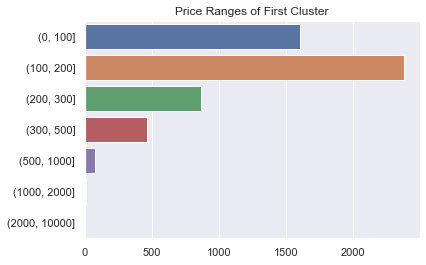

In [74]:
# Price range of 1 cluster
price_rr = pd.cut(price_1,[0, 100, 200, 300, 500, 1000, 2000, 10000]).value_counts().sort_index()
sns.barplot(x=price_rr.values, y=price_rr.index).set(title='Price Ranges of First Cluster')

[Text(0.5, 1.0, 'Price Ranges of Second Cluster')]

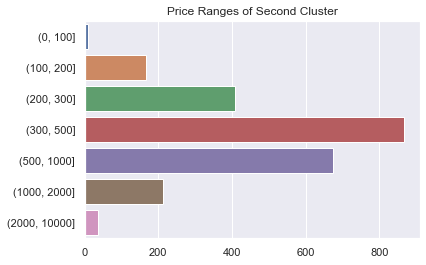

In [75]:
# Price range of the other cluster
price_br = pd.cut(price_2,[0, 100, 200, 300, 500, 1000, 2000, 10000]).value_counts().sort_index()
sns.barplot(x=price_br.values, y=price_br.index).set(title='Price Ranges of Second Cluster')

In [76]:
data= {
          'ranges': ['0-100', '100-200', '200-300', '300-500', '500-1000', '1000-2000', '2000-10000'],
          'first': price_rr.values, 
          'second': price_br.values
      }
price_df = pd.DataFrame(data=data)

In [77]:
price_df

,ranges,first,second
0,0-100,1604,10
1,100-200,2377,166
2,200-300,869,408
3,300-500,468,866
4,500-1000,79,674
5,1000-2000,10,214
6,2000-10000,2,36


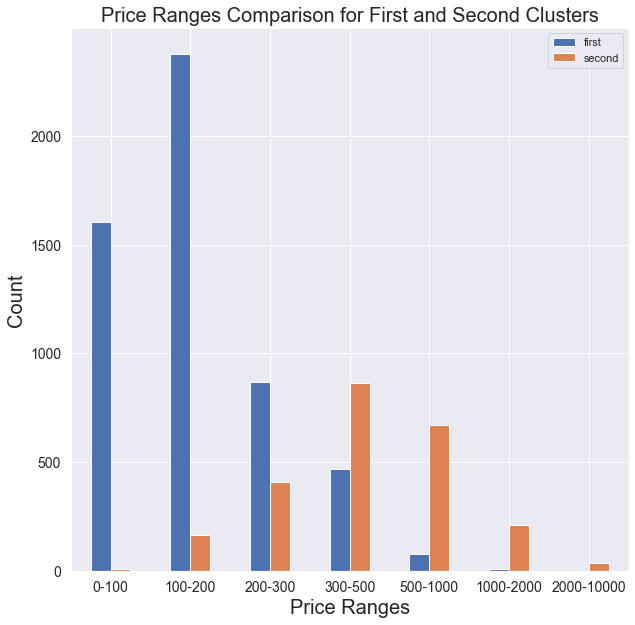

In [78]:
price_df.plot(x='ranges', y=['first', 'second'], kind='bar', figsize=(10,10), rot=0, legend=True)
plt.title('Price Ranges Comparison for First and Second Clusters', size=20)
plt.xlabel('Price Ranges', size=20)
plt.ylabel('Count', size=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
f4 = plt.gcf()

Notice our plotMap function colored the first cluster blue and second red. From this, we can see that even though the smaller mean price from the blue cluster could be explained by its larger amount of data, we could still see how its distribution of prices is right-skewed.

Let's now explore the room types of each cluster.

[Text(0.5, 0, 'Room type'),
 Text(0, 0.5, 'count'),
 Text(0.5, 1.0, 'Room types of First Cluster')]

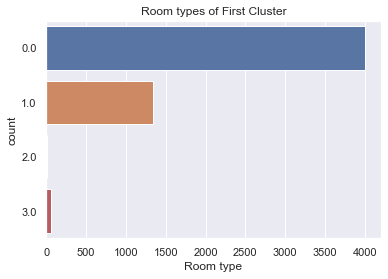

In [79]:
room_type_1 = np.unique(room_1, return_counts=True)
plot = sns.barplot(x=room_type_1[1], y=room_type_1[0], orient='h')
plot.set(xlabel='Room type', ylabel='count', title='Room types of First Cluster')

In [80]:
np.unique(room_1, return_counts=True)

(array([0., 1., 2., 3.]), array([4000, 1346,    6,   57], dtype=int64))

[Text(0.5, 0, 'Room type'),
 Text(0, 0.5, 'count'),
 Text(0.5, 1.0, 'Room types of Second Cluster')]

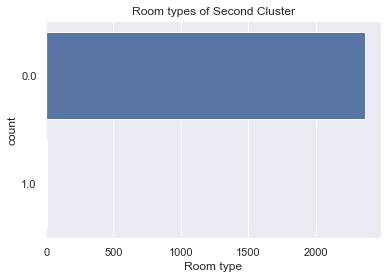

In [81]:
room_type_2 = np.unique(room_2, return_counts=True)
plot = sns.barplot(x=room_type_2[1], y=room_type_2[0], orient='h')
plot.set(xlabel='Room type', ylabel='count', title='Room types of Second Cluster')

'Entire home/apt' : 0, 'Private room' : 1, 'Hotel room' : 2, 'Shared room' : 3

Accommodations:

[Text(0.5, 0, 'Frequency'),
 Text(0, 0.5, 'Accommodation Count'),
 Text(0.5, 1.0, 'Accommodations of First Cluster')]

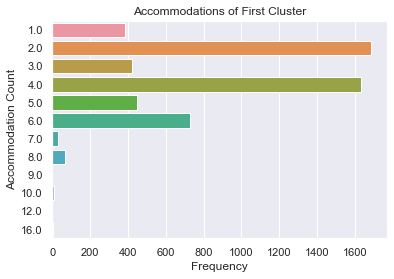

In [82]:
accom_data_1 = np.unique(accom_1, return_counts=True)
plot = sns.barplot(x=accom_data_1[1], y=accom_data_1[0], orient='h')
plot.set(xlabel='Frequency', ylabel='Accommodation Count', title='Accommodations of First Cluster')

[Text(0.5, 0, 'Frequency'),
 Text(0, 0.5, 'Accommodation Count'),
 Text(0.5, 1.0, 'Accommodations of Second Cluster')]

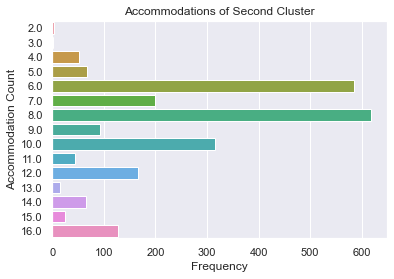

In [83]:
accom_data_2 = np.unique(accom_2, return_counts=True)
plot = sns.barplot(x=accom_data_2[1], y=accom_data_2[0], orient='h')
plot.set(xlabel='Frequency', ylabel='Accommodation Count', title='Accommodations of Second Cluster')

Based on the above plots for, we can see the the ones near the coast have higher price and more accommodations in general (keep in mind the difference in the amount of data point in each cluster).

We're now exploring the neighborhoods of each cluster

In [84]:
np.unique(neighbor_1, return_counts=True)

(array(['Allied Gardens', 'Alta Vista', 'Amphitheater And Water Park',
        'Balboa Park', 'Bario Logan', 'Bay Ho', 'Bay Park', 'Bay Terrace',
        'Bird Land', 'Bonita Long Canyon', 'Carmel Mountain',
        'Carmel Valley', 'Chollas View', 'City Heights East',
        'City Heights West', 'Clairemont Mesa', 'College Area', 'Columbia',
        'Core', 'Cortez Hill', 'Darnall', 'Del Cerro', 'Del Mar Heights',
        'East Lake', 'East Village', 'Eastlake Trails', 'Eastlake Vistas',
        'Egger Highlands', 'El Cerritos', 'Emerald Hills', 'Encanto',
        'Estlake Greens', 'Gaslamp Quarter', 'Gateway', 'Grant Hill',
        'Grantville', 'Horton Plaza', 'Jomacha-Lomita', 'Kearny Mesa',
        'Kensington', 'La Jolla', 'La Jolla Village', 'Lake Murray',
        'Lincoln Park', 'Linda Vista', 'Little Italy', 'Loma Portal',
        'Lynwood Hills', 'Marina', 'Memorial', 'Midtown',
        'Midtown District', 'Mira Mesa', 'Mission Bay', 'Mission Valley',
        'Moreno Mission

In [85]:
np.unique(neighbor_2, return_counts=True)

(array(['Allied Gardens', 'Alta Vista', 'Balboa Park', 'Bario Logan',
        'Bay Ho', 'Bay Park', 'Bay Terrace', 'Bird Land',
        'Bonita Long Canyon', 'Carmel Mountain', 'Carmel Valley',
        'Chollas View', 'City Heights East', 'City Heights West',
        'Clairemont Mesa', 'College Area', 'Columbia', 'Core',
        'Cortez Hill', 'Del Cerro', 'Del Mar Heights', 'East Lake',
        'East Village', 'Eastlake Trails', 'Egger Highlands',
        'Emerald Hills', 'Encanto', 'Estlake Greens', 'Gaslamp Quarter',
        'Gateway', 'Grant Hill', 'Grantville', 'Jomacha-Lomita',
        'Kensington', 'La Jolla', 'La Jolla Village', 'Lake Murray',
        'Linda Vista', 'Little Italy', 'Loma Portal', 'Lynwood Hills',
        'Marina', 'Memorial', 'Midtown', 'Midtown District', 'Mira Mesa',
        'Mission Bay', 'Mission Valley', 'Moreno Mission', 'Mount Hope',
        'Mountain View', 'Nestor', 'Normal Heights', 'North City',
        'North Clairemont', 'North Hills', 'Northwest',

In [86]:
a1, b1 = np.unique(neighbor_1, return_counts=True)
dict_1 = dict(zip(a1, b1))
{k: v for k, v in sorted(dict_1.items(), key=lambda item: -item[1])}

{'Mission Bay': 566,
 'Pacific Beach': 451,
 'North Hills': 324,
 'Ocean Beach': 308,
 'Midtown': 288,
 'East Village': 260,
 'La Jolla': 235,
 'Loma Portal': 161,
 'Balboa Park': 135,
 'Mira Mesa': 126,
 'Old Town': 125,
 'Park West': 123,
 'Gaslamp Quarter': 116,
 'West University Heights': 110,
 'Little Italy': 107,
 'University City': 94,
 'Normal Heights': 89,
 'Grant Hill': 88,
 'City Heights West': 85,
 'Clairemont Mesa': 77,
 'Bay Park': 75,
 'Cortez Hill': 66,
 'Carmel Valley': 57,
 'South Park': 57,
 'Bay Ho': 56,
 'Linda Vista': 56,
 'Core': 55,
 'Moreno Mission': 53,
 'Northwest': 53,
 'Marina': 51,
 'Memorial': 50,
 'College Area': 48,
 'City Heights East': 45,
 'North Clairemont': 43,
 'Roseville': 40,
 'Rancho Penasquitos': 39,
 'Serra Mesa': 36,
 'Grantville': 29,
 'Mission Valley': 29,
 'Otay Ranch': 27,
 'Southwest': 27,
 'Midtown District': 25,
 'Kensington': 23,
 'Mountain View': 23,
 'Del Mar Heights': 21,
 'La Jolla Village': 21,
 'San Carlos': 21,
 'San Ysidro': 

In [87]:
a2, b2 = np.unique(neighbor_2, return_counts=True)
dict_2 = dict(zip(a2, b2))
{k: v for k, v in sorted(dict_2.items(), key=lambda item: -item[1])}

{'Mission Bay': 754,
 'Pacific Beach': 265,
 'La Jolla': 253,
 'Ocean Beach': 96,
 'Midtown': 69,
 'Loma Portal': 55,
 'North Hills': 48,
 'Bay Park': 44,
 'East Village': 41,
 'Old Town': 35,
 'Clairemont Mesa': 34,
 'Grant Hill': 29,
 'Moreno Mission': 29,
 'Carmel Valley': 28,
 'Roseville': 27,
 'Northwest': 26,
 'Linda Vista': 25,
 'Mira Mesa': 24,
 'Park West': 22,
 'Balboa Park': 21,
 'Del Mar Heights': 21,
 'University City': 21,
 'Rancho Penasquitos': 20,
 'North Clairemont': 18,
 'Wooded Area': 18,
 'Serra Mesa': 16,
 'West University Heights': 15,
 'Bay Ho': 14,
 'Little Italy': 14,
 'San Carlos': 12,
 'Gaslamp Quarter': 11,
 'Mount Hope': 11,
 'Bird Land': 10,
 'Memorial': 10,
 'North City': 10,
 'Southwest': 10,
 'City Heights West': 9,
 'College Area': 9,
 'Encanto': 9,
 'Grantville': 9,
 'Torrey Pines': 9,
 'Lake Murray': 8,
 'Mission Valley': 8,
 'Core': 7,
 'Emerald Hills': 7,
 'La Jolla Village': 7,
 'Normal Heights': 7,
 'Rancho Bernadino': 7,
 'Del Cerro': 6,
 'Midto

### Visualizing the 6PC data clusters on actual map

In [88]:
# Here, we're using the 6 PCs data with prices dropped
location_map, price_1, price_2, room_1, room_2, accom_1, accom_2, neighbor_1, neighbor_2 = plotMap(res_noPrice6PC)
location_map

[Text(0.5, 1.0, 'Price Ranges of First Cluster')]

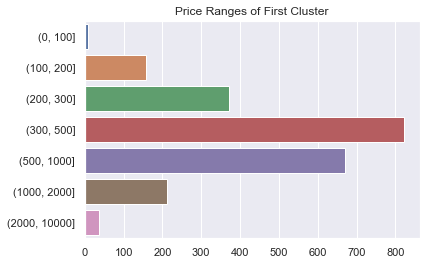

In [89]:
# Price range of one cluster
price_rr = pd.cut(price_1,[0, 100, 200, 300, 500, 1000, 2000, 10000]).value_counts().sort_index()
sns.barplot(x=price_rr.values, y=price_rr.index).set(title='Price Ranges of First Cluster')

[Text(0.5, 1.0, 'Price Ranges of Second Cluster')]

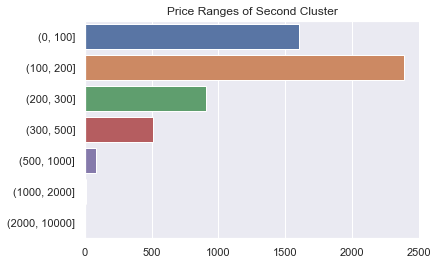

In [90]:
# Price range of the other cluster
price_br = pd.cut(price_2,[0, 100, 200, 300, 500, 1000, 2000, 10000]).value_counts().sort_index()
sns.barplot(x=price_br.values, y=price_br.index).set(title='Price Ranges of Second Cluster')

In [91]:
data= {
          'ranges': ['0-100', '100-200', '200-300', '300-500', '500-1000', '1000-2000', '2000-10000'],
          'first': price_rr.values, 
          'second': price_br.values
      }
price_df = pd.DataFrame(data=data)

In [92]:
np.mean(price_1)

568.6457418788411

In [93]:
np.mean(price_2)

174.45867393278837

In [94]:
price_df

,ranges,first,second
0,0-100,9,1605
1,100-200,158,2385
2,200-300,372,905
3,300-500,821,513
4,500-1000,670,83
5,1000-2000,212,12
6,2000-10000,36,2


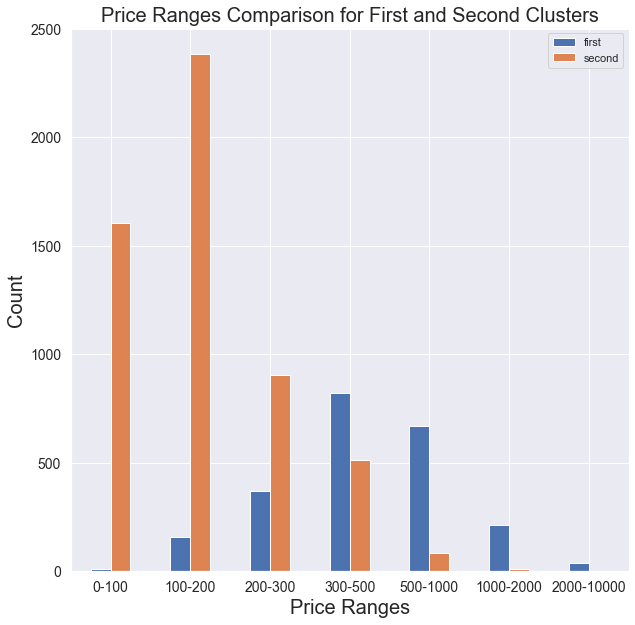

In [95]:
price_df.plot(x='ranges', y=['first', 'second'], kind='bar', figsize=(10,10), rot=0, legend=True)
plt.title('Price Ranges Comparison for First and Second Clusters', size=20)
plt.xlabel('Price Ranges', size=20)
plt.ylabel('Count', size=20)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
f4 = plt.gcf()

Room types:

[Text(0.5, 0, 'Room type'),
 Text(0, 0.5, 'count'),
 Text(0.5, 1.0, 'Room types of First Cluster')]

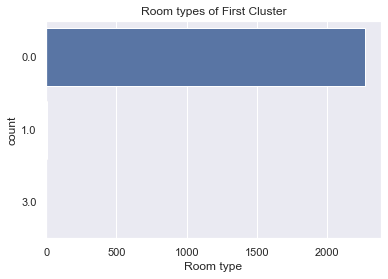

In [96]:
room_type_1 = np.unique(room_1, return_counts=True)
plot = sns.barplot(x=room_type_1[1], y=room_type_1[0], orient='h')
plot.set(xlabel='Room type', ylabel='count', title='Room types of First Cluster')

[Text(0.5, 17.246875000000003, 'Room type'),
 Text(17.200000000000003, 0.5, 'count'),
 Text(0.5, 1.0, 'Room types of Second Cluster')]

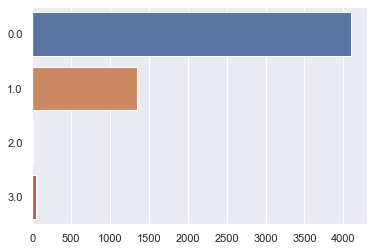

In [97]:
room_type_2 = np.unique(room_2, return_counts=True)
sns.barplot(x=room_type_2[1], y=room_type_2[0], orient='h')
plot.set(xlabel='Room type', ylabel='count', title='Room types of Second Cluster')

'Entire home/apt' : 0, 'Private room' : 1, 'Hotel room' : 2, 'Shared room' : 3

Accommodations:

[Text(0.5, 0, 'Frequency'),
 Text(0, 0.5, 'Accommodation Count'),
 Text(0.5, 1.0, 'Accommodations of First Cluster')]

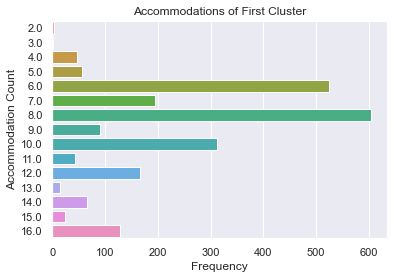

In [98]:
accom_data_1 = np.unique(accom_1, return_counts=True)
plot = sns.barplot(x=accom_data_1[1], y=accom_data_1[0], orient='h')
plot.set(xlabel='Frequency', ylabel='Accommodation Count', title='Accommodations of First Cluster')

[Text(0.5, 0, 'Frequency'),
 Text(0, 0.5, 'Accommodation Count'),
 Text(0.5, 1.0, 'Accommodations of Second Cluster')]

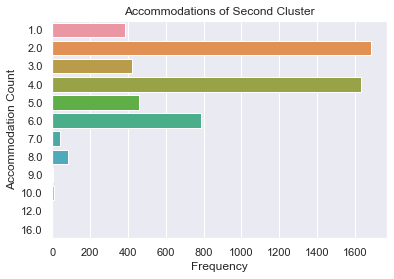

In [99]:
accom_data_2 = np.unique(accom_2, return_counts=True)
plot = sns.barplot(x=accom_data_2[1], y=accom_data_2[0], orient='h')
plot.set(xlabel='Frequency', ylabel='Accommodation Count', title='Accommodations of Second Cluster')

Again, we see the same pattern in the dataset with 6 PCs. We can see the the ones near the coast have higher price and more accommodations in general (keep in mind the difference in the amount of data point in each cluster).

Below is our neighborhood pattern exploration. Specifically, we looked at the neighborhood with the most count in each cluster.

In [100]:
np.unique(neighbor_1, return_counts=True)

(array(['Allied Gardens', 'Alta Vista', 'Balboa Park', 'Bario Logan',
        'Bay Ho', 'Bay Park', 'Bay Terrace', 'Bird Land',
        'Carmel Mountain', 'Carmel Valley', 'Chollas View',
        'City Heights East', 'City Heights West', 'Clairemont Mesa',
        'College Area', 'Columbia', 'Core', 'Cortez Hill', 'Del Cerro',
        'Del Mar Heights', 'East Lake', 'East Village', 'Eastlake Trails',
        'Egger Highlands', 'Emerald Hills', 'Encanto', 'Estlake Greens',
        'Gaslamp Quarter', 'Gateway', 'Grant Hill', 'Grantville',
        'Jomacha-Lomita', 'Kensington', 'La Jolla', 'La Jolla Village',
        'Lake Murray', 'Linda Vista', 'Little Italy', 'Loma Portal',
        'Lynwood Hills', 'Marina', 'Memorial', 'Midtown',
        'Midtown District', 'Mira Mesa', 'Mission Bay', 'Mission Valley',
        'Moreno Mission', 'Mount Hope', 'Mountain View', 'Nestor',
        'Normal Heights', 'North City', 'North Clairemont', 'North Hills',
        'Northwest', 'Oak Park', 'Ocean Be

In [101]:
np.unique(neighbor_1, return_counts=True)[0][np.unique(neighbor_1, return_counts=True)[1] == 708]

array(['Mission Bay'], dtype='<U32')

In [102]:
np.unique(neighbor_2, return_counts=True)

(array(['Allied Gardens', 'Alta Vista', 'Amphitheater And Water Park',
        'Balboa Park', 'Bario Logan', 'Bay Ho', 'Bay Park', 'Bay Terrace',
        'Bird Land', 'Bonita Long Canyon', 'Carmel Mountain',
        'Carmel Valley', 'Chollas View', 'City Heights East',
        'City Heights West', 'Clairemont Mesa', 'College Area', 'Columbia',
        'Core', 'Cortez Hill', 'Darnall', 'Del Cerro', 'Del Mar Heights',
        'East Lake', 'East Village', 'Eastlake Trails', 'Eastlake Vistas',
        'Egger Highlands', 'El Cerritos', 'Emerald Hills', 'Encanto',
        'Estlake Greens', 'Gaslamp Quarter', 'Gateway', 'Grant Hill',
        'Grantville', 'Horton Plaza', 'Jomacha-Lomita', 'Kearny Mesa',
        'Kensington', 'La Jolla', 'La Jolla Village', 'Lake Murray',
        'Lincoln Park', 'Linda Vista', 'Little Italy', 'Loma Portal',
        'Lynwood Hills', 'Marina', 'Memorial', 'Midtown',
        'Midtown District', 'Mira Mesa', 'Mission Bay', 'Mission Valley',
        'Moreno Mission

In [103]:
np.unique(neighbor_2, return_counts=True)[0][np.unique(neighbor_2, return_counts=True)[1] == 612]

array(['Mission Bay'], dtype='<U32')

We're now looking at the sorted neighborhood frequency for both clusters (NOTE: ignore the color naming)

In [104]:
a1, b1 = np.unique(neighbor_1, return_counts=True)
dict_1 = dict(zip(a1, b1))
{k: v for k, v in sorted(dict_1.items(), key=lambda item: -item[1])}

{'Mission Bay': 708,
 'Pacific Beach': 251,
 'La Jolla': 246,
 'Ocean Beach': 92,
 'Midtown': 66,
 'Loma Portal': 53,
 'North Hills': 47,
 'Bay Park': 43,
 'East Village': 38,
 'Clairemont Mesa': 34,
 'Old Town': 34,
 'Carmel Valley': 28,
 'Moreno Mission': 28,
 'Grant Hill': 27,
 'Roseville': 27,
 'Northwest': 26,
 'Mira Mesa': 25,
 'Linda Vista': 24,
 'Balboa Park': 21,
 'Del Mar Heights': 21,
 'University City': 21,
 'Park West': 20,
 'Rancho Penasquitos': 20,
 'North Clairemont': 18,
 'Wooded Area': 17,
 'Serra Mesa': 16,
 'Bay Ho': 14,
 'West University Heights': 14,
 'Little Italy': 13,
 'San Carlos': 12,
 'Mount Hope': 11,
 'Bird Land': 10,
 'Memorial': 10,
 'North City': 10,
 'Southwest': 10,
 'City Heights West': 9,
 'College Area': 9,
 'Encanto': 9,
 'Gaslamp Quarter': 9,
 'Grantville': 9,
 'Torrey Pines': 9,
 'Lake Murray': 8,
 'Mission Valley': 8,
 'Emerald Hills': 7,
 'La Jolla Village': 7,
 'Normal Heights': 7,
 'Rancho Bernadino': 7,
 'Del Cerro': 6,
 'Midtown District':

In [105]:
a2, b2 = np.unique(neighbor_2, return_counts=True)
dict_2 = dict(zip(a2, b2))
{k: v for k, v in sorted(dict_2.items(), key=lambda item: -item[1])}

{'Mission Bay': 612,
 'Pacific Beach': 465,
 'North Hills': 325,
 'Ocean Beach': 312,
 'Midtown': 291,
 'East Village': 263,
 'La Jolla': 242,
 'Loma Portal': 163,
 'Balboa Park': 135,
 'Old Town': 126,
 'Mira Mesa': 125,
 'Park West': 125,
 'Gaslamp Quarter': 118,
 'West University Heights': 111,
 'Little Italy': 108,
 'University City': 94,
 'Grant Hill': 90,
 'Normal Heights': 89,
 'City Heights West': 85,
 'Clairemont Mesa': 77,
 'Bay Park': 76,
 'Cortez Hill': 66,
 'Carmel Valley': 57,
 'Core': 57,
 'Linda Vista': 57,
 'South Park': 57,
 'Bay Ho': 56,
 'Moreno Mission': 54,
 'Northwest': 53,
 'Marina': 52,
 'Memorial': 50,
 'College Area': 48,
 'City Heights East': 45,
 'North Clairemont': 43,
 'Roseville': 40,
 'Rancho Penasquitos': 39,
 'Serra Mesa': 36,
 'Grantville': 29,
 'Mission Valley': 29,
 'Otay Ranch': 27,
 'Southwest': 27,
 'Midtown District': 25,
 'Kensington': 23,
 'Mountain View': 23,
 'Del Mar Heights': 21,
 'La Jolla Village': 21,
 'San Carlos': 21,
 'San Ysidro': 